# Feduvim

## Imports of the libraries 

In [1]:
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Load of the CSV file

In [2]:
dfRawData = pd.read_csv("HousePrices-ToBuildAndTestTheModel.csv")
dfRawData.shape

(1460, 81)

## Read of the Columns type

In [3]:
dfRawData.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


## Display of the samples

In [4]:
dfRawData.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

## Display of the columns with null values

In [5]:
dfToClean = dfRawData
dfToClean.columns[dfToClean.isnull().any()]

Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

## Fill of the data

In [6]:
dfToClean["LotFrontage"].fillna(dfToClean['LotFrontage'].mean(), inplace = True)
dfToClean["Alley"].fillna("NA", inplace = True)
dfToClean["MasVnrType"].fillna("None", inplace = True)
dfToClean["MasVnrArea"].fillna(0, inplace = True)
dfToClean["BsmtQual"].fillna("NA", inplace = True)
dfToClean["BsmtCond"].fillna("NA", inplace = True)
dfToClean["BsmtExposure"].fillna("NA", inplace = True)
dfToClean["BsmtFinType1"].fillna("NA", inplace = True)
dfToClean["BsmtFinType2"].fillna("NA", inplace = True)
dfToClean["Electrical"].fillna("SBrkr", inplace = True)
dfToClean["FireplaceQu"].fillna("NA", inplace = True)
dfToClean["GarageType"].fillna("NA", inplace = True)
dfToClean["GarageYrBlt"].fillna("NA", inplace = True)
dfToClean["GarageFinish"].fillna("NA", inplace = True)
dfToClean["GarageQual"].fillna("NA", inplace = True)
dfToClean["GarageCond"].fillna("NA", inplace = True)
dfToClean["PoolQC"].fillna("NA", inplace = True)
dfToClean["Fence"].fillna("NA", inplace = True)
dfToClean["MiscFeature"].fillna("NA", inplace = True)

## Check for null values

In [7]:
dfToClean.columns[dfToClean.isnull().any()]

Index([], dtype='object')

## Check for duplicates

In [8]:
dfToClean[dfToClean.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


## Separation of the dataframe into two dataframes

In [9]:
objList = dfToClean.select_dtypes(include=np.object).columns.tolist()
dfToCleanNum = dfToClean.drop(objList, axis = 1)
numList = dfToClean.select_dtypes(include=np.number).columns.tolist()
dfToCleanObj = dfToClean.drop(numList, axis = 1)

## Turns all objects into strings and transforms the strings columns into numeric columns

In [10]:
dfToCleanObj = dfToCleanObj.astype(str)
dfToCleanObj = dfToCleanObj.apply(LabelEncoder().fit_transform)
dfToCleanObj

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,3,1,1,3,3,0,4,0,5,2,2,0,5,1,1,12,13,1,2,4,2,2,4,4,2,6,1,0,1,4,2,6,3,1,89,2,5,5,2,3,4,1,8,4
1,3,1,1,3,3,0,2,0,24,1,2,0,2,1,1,8,8,2,3,4,1,2,4,1,0,6,1,0,1,4,3,6,5,1,62,2,5,5,2,3,4,1,8,4
2,3,1,1,0,3,0,4,0,5,2,2,0,5,1,1,12,13,1,2,4,2,2,4,2,2,6,1,0,1,4,2,6,5,1,87,2,5,5,2,3,4,1,8,4
3,3,1,1,0,3,0,0,0,6,2,2,0,5,1,1,13,15,2,3,4,0,4,1,4,0,6,1,2,1,4,2,6,2,5,84,3,5,5,2,3,4,1,8,0
4,3,1,1,0,3,0,2,0,15,2,2,0,5,1,1,12,13,1,2,4,2,2,4,0,2,6,1,0,1,4,2,6,5,1,86,2,5,5,2,3,4,1,8,4
5,3,1,1,0,3,0,4,0,11,2,2,0,0,1,1,12,13,2,3,4,5,2,4,4,2,6,1,0,1,4,3,6,3,1,79,3,5,5,2,3,2,3,8,4
6,3,1,1,3,3,0,4,0,21,2,2,0,2,1,1,12,13,3,2,4,2,0,4,0,2,6,1,0,1,4,2,6,2,1,90,2,5,5,2,3,4,1,8,4
7,3,1,1,0,3,0,0,0,14,4,2,0,5,1,1,6,6,3,3,4,1,2,4,2,0,1,1,0,1,4,3,6,5,1,59,2,5,5,2,3,4,3,8,4
8,4,1,1,3,3,0,4,0,17,0,2,0,0,1,1,3,15,2,3,4,0,4,4,4,6,6,1,2,1,1,3,2,5,5,19,3,1,5,2,3,4,1,8,0
9,3,1,1,3,3,0,0,0,3,0,0,1,1,1,1,8,8,2,3,4,0,4,4,4,2,6,1,0,1,4,3,6,5,1,27,2,2,5,2,3,4,1,8,4


## Creation of the dataframe

In [11]:
dfBasicCleaning = pd.concat([dfToCleanNum, dfToCleanObj], axis=1, join="outer")
dfToClean = dfBasicCleaning

## Display of the shape

In [12]:
dfToClean.shape

(1460, 81)

## Find the outliers and remove them

In [13]:
def find_outliers(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers


def remove_outliers(df, column):
    for col in list(column):
        outliers = find_outliers(df[col]).index
    for i in outliers:
        i += 1
        df = df.drop(df[(df['Id'] == i)].index)
    return df    

## Display of the correlation

In [14]:
dfToClean.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
Id,1.000000,0.011156,-9.600822e-03,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.051071,-0.005024,-0.005968,-0.007940,-0.015415,0.010496,0.005590,-0.044230,0.008273,0.002289,-0.020155,0.005587,0.006784,0.037719,0.002951,0.027239,-0.019772,0.016570,0.017634,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917,-0.006096,0.008916,-0.002855,0.032122,-0.019659,1.332409e-02,0.049756,0.005847,-0.013735,-0.003815,0.001839,0.021912,0.018111,0.038675,-0.022562,-0.034694,-0.042847,0.051971,0.001689,0.029826,0.008514,0.047668,0.007223,-0.025879,0.016616,0.045877,0.042120,0.002157,0.009821,0.037632,-0.004432,-0.001064,0.003765,-0.007822,-0.004807,-0.004626,0.001955,-0.008379,0.005971,-0.033928,-0.000399,-0.038103,0.019773,-0.005806
MSSubClass,0.011156,1.000000,-3.570559e-01,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.023573,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284,0.035900,-0.024969,0.099430,0.119289,-0.002940,-2.284384e-02,0.075910,-0.025672,-0.005985,-0.024762,-0.042395,0.746063,0.397161,-0.117817,-0.031336,-0.089159,-0.137229,-0.029850,-0.017161,-0.003254,0.058126,-0.081702,-0.017905,-0.065218,0.006437,0.037025,0.048009,0.020760,-0.101774,0.051945,0.010129,0.003711,0.050200,0.133138,0.105910,-0.028806,-0.038571,-0.045895,-0.059925,-0.005221,0.086360,-0.046881,0.012464,-0.024940
LotFrontage,-0.009601,-0.357056,1.000000e+00,0.306795,0.234196,-0.052820,0.117598,0.082746,0.178699,0.215828,0.043340,0.122156,0.363358,0.414266,0.072483,0.036849,0.368392,0.091481,-0.006419,0.180424,0.048258,0.237023,-0.005805,0.320146,0.235755,0.269729,0.323663,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,0.001168,0.010158,0.006768,0.334901,-0.106363,-0.037323,-0.065017,-0.144931,-0.075647,-5.447825e-18,-0.181253,0.067608,0.084545,-0.008483,0.003214,-0.408564,0.031907,0.153467,0.082026,0.074448,0.098756,-0.020220,-0.183293,0.047951,0.098809,-0.139701,0.055936,-0.130047,-0.023136,-0.017142,-0.020815,-0.079975,0.068666,0.060213,-0.189082,0.030250,-0.016492,-0.255709,0.031195,-0.155136,0.094808,0.091630,0.089073,-0.191630,-0.036751,0.009213,-0.030846,0.058464
LotArea,-0.033226,-0.139781,3.067946e-01,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103321,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843,-0.034452,-0.197131,-0.029676,-0.165315,-0.149083,1.012318e-02,-0.121161,0.436868,0.044569,0.023846,0.022164,-0.205721,-0.033190,0.077054,0.149837,0.004256,-0.003930,-0.008122,-0.057275,0.015160,-0.011081,-0.061495,0.016715,-0.152436,-0.057081,-0.056425,0.028158,0.004212,0.049755,0.043856,-0.057018,-0.022317,0.005323,-0.150162,-0.047061,-0.087669,0.053079,0.065741,0.015134,-0.065167,0.036031,0.106135,0.012292,0.034169
OverallQual,-0.02836

## Removal of the outliers

In [15]:
dfToClean = remove_outliers(dfToClean, ["OverallQual"])
dfToClean = remove_outliers(dfToClean, ["TotalBsmtSF"])
dfToClean = remove_outliers(dfToClean, ["1stFlrSF"])
dfToClean = remove_outliers(dfToClean, ["GrLivArea"])
dfToClean = remove_outliers(dfToClean, ["FullBath"])
dfToClean = remove_outliers(dfToClean, ["GarageCars"])
dfToClean = remove_outliers(dfToClean, ["GarageArea"])

## Creation of the dataframe 

In [16]:
dfCleaned = dfToClean
dfCleaned.shape

(1345, 81)

## Display the SalePrice

In [17]:
dfCleaned['SalePrice'].describe()

count      1345.000000
mean     174217.515242
std       64673.287284
min       34900.000000
25%      130000.000000
50%      160000.000000
75%      205950.000000
max      451950.000000
Name: SalePrice, dtype: float64

## Display the values of SalePrice

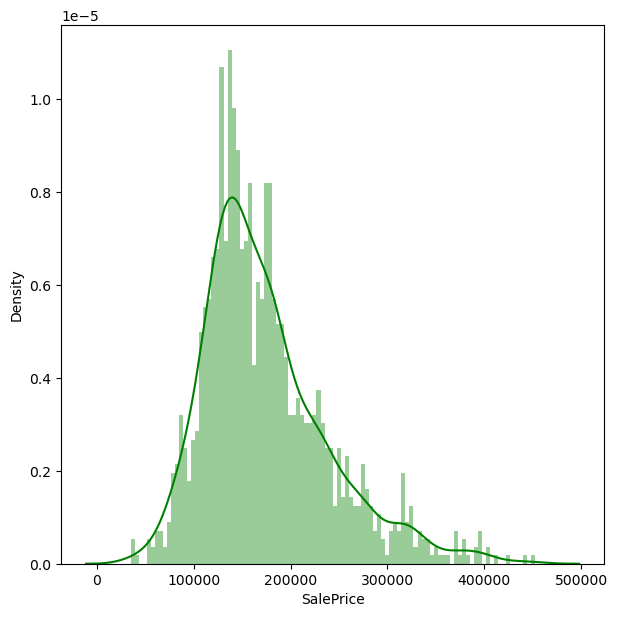

In [18]:
plt.figure(figsize=(7, 7))
sns.distplot(dfCleaned['SalePrice'], color='g', bins=100, hist_kws={'alpha': 0.4});

## Display the heatmap of the correlation 

In [19]:
fig = plt.figure(figsize=(45,45), dpi = 300)
sns.heatmap(dfToClean.corr(), annot = True, fmt = '.1f')

<AxesSubplot:>

## Display the relation between SalePrice and OverallQual

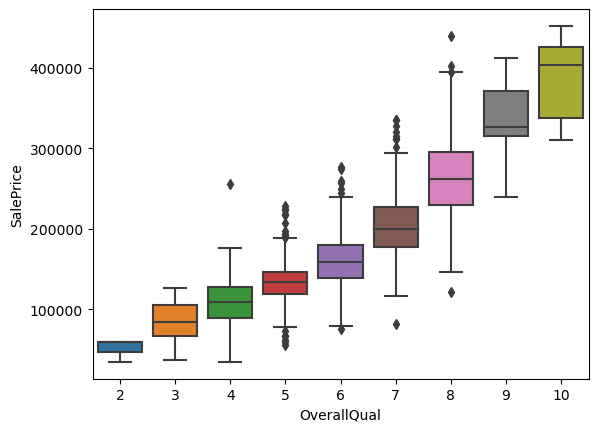

In [20]:
sns.boxplot(x='OverallQual', y='SalePrice', data=dfCleaned)
plt.show()

## Display the relation between thw SalePrice and the BsmtQual

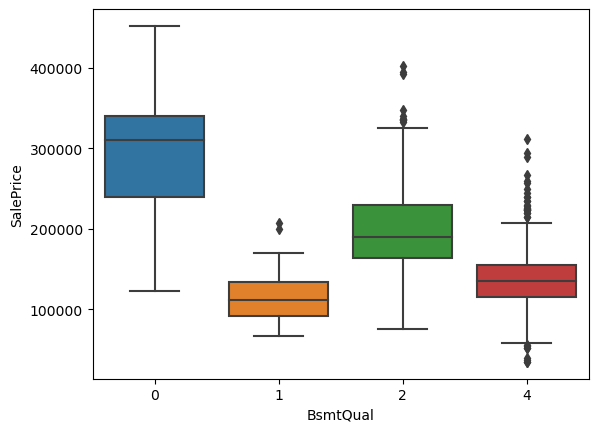

In [21]:
sns.boxplot(x='BsmtQual', y='SalePrice', data=dfCleaned)
plt.show()

## Display the histograms

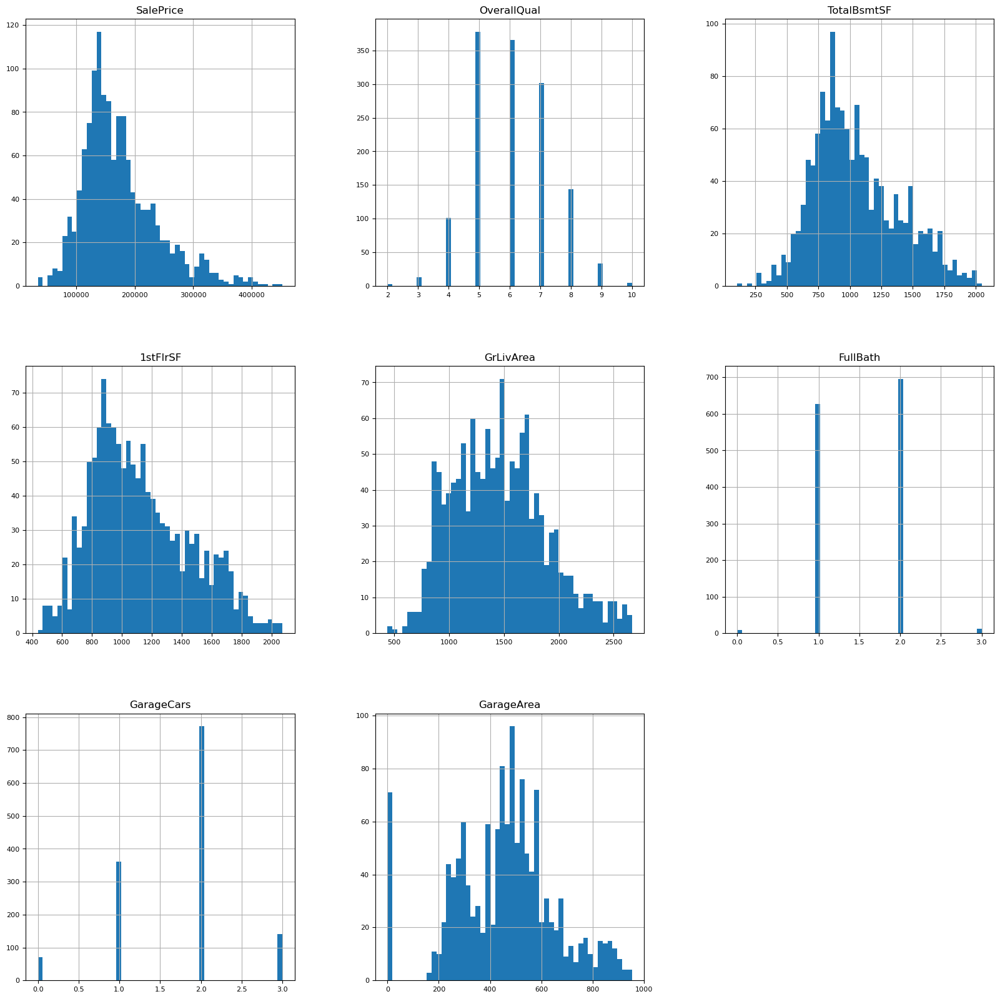

In [22]:
dfCleanedNum = dfCleaned[["SalePrice", "OverallQual", "TotalBsmtSF", "1stFlrSF", "GrLivArea", "FullBath","GarageCars","GarageArea"]]
dfCleanedNum.hist(figsize=(20, 20), bins=50, xlabelsize=8, ylabelsize=8);

## Separate the Dependent variable from the Independent variables 

In [23]:
y = dfCleaned.SalePrice
col = dfCleaned.columns.tolist()
col.remove('SalePrice')
col.remove('Id')
col.remove('LotShape')
col.remove('LandContour')
col.remove('LotConfig')
col.remove('LandSlope')
col.remove('Neighborhood')
col.remove('Condition1')
col.remove('Condition2')
col.remove('HouseStyle')
col.remove('RoofStyle')
col.remove('RoofMatl')
col.remove('Exterior1st')
col.remove('Exterior2nd')
col.remove('MasVnrType')
col.remove('MasVnrArea')
col.remove('ExterQual')
col.remove('BsmtCond')
col.remove('BsmtExposure')
col.remove('BsmtFinSF1')
col.remove('BsmtFinType2')
col.remove('BsmtFinSF2')
col.remove('BsmtUnfSF')
col.remove('LowQualFinSF')
col.remove('GrLivArea')
col.remove('BsmtFullBath')
col.remove('BsmtHalfBath')
col.remove('FullBath')
col.remove('HalfBath')
col.remove('Fireplaces')
col.remove('FireplaceQu')
col.remove('TotalBsmtSF')
col.remove('GarageType')
col.remove('GarageYrBlt')
col.remove('GarageFinish')
col.remove('GarageCars')
col.remove('GarageQual')
col.remove('GarageCond')
col.remove('PavedDrive')
col.remove('WoodDeckSF')
col.remove('EnclosedPorch')
col.remove('3SsnPorch')
col.remove('ScreenPorch')
col.remove('MiscVal')
col.remove('MoSold')
col.remove('YrSold')
col.remove('MSSubClass')
col.remove('Alley')
col.remove('SaleType')
col.remove('SaleCondition')
col.remove('MiscFeature')
col.remove('2ndFlrSF')
col.remove('1stFlrSF')
col.remove('Fence')
col.remove('Street')
col.remove('OpenPorchSF')
x = dfCleaned[col]

## Display the Independent variables

In [24]:
print(x.columns)

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'GarageArea', 'PoolArea', 'MSZoning', 'Utilities', 'BldgType',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtFinType1', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'PoolQC'],
      dtype='object')


## Separate the train and test data

In [25]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)

##  Regression model

In [26]:
finalModel = LinearRegression()
finalModel.fit(x_train, y_train)

LinearRegression()

## Create predictions

In [27]:
predictions = finalModel.predict(x_test)

## Display the predictions

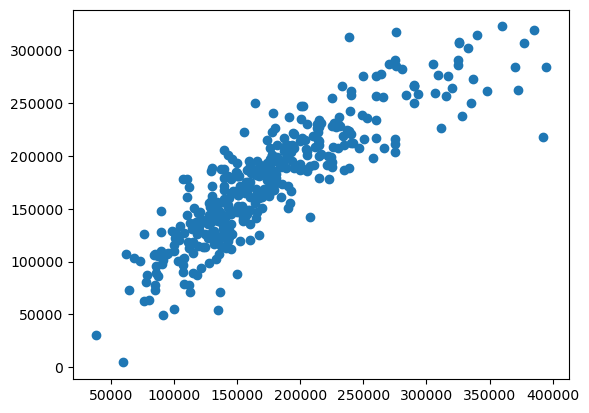

In [28]:
dfCompare = pd.DataFrame({'Actual': y_test, 'Predicted':predictions})
plt.scatter(y_test, predictions)

## Create the predictions for the test data

In [29]:
dfCompare = pd.DataFrame({'Actual': y_test, 'Predicted':predictions})
dfCompare

,Actual,Predicted
973,182000,210255.599997
289,153575,153026.748172
121,100000,54710.153126
1237,195000,207086.756690
344,85000,78066.386361
1213,145000,112260.647743
170,128500,151930.235308
864,250580,215801.498522
729,103000,100870.268994
218,311500,226045.828845


## Display the metrics

In [30]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

Mean Absolute Error: 22585.83420199475
Mean Squared Error: 936083489.3591324
Mean Absolute Percentage Error: 0.13828833129403173
Root Mean Squared Error: 30595.481518667628


## Display the model

In [31]:
finalModel.score(x_train, y_train)

0.8361333160974915

## Creation of the new linear regression

In [32]:
y_test_array = y_test.array.reshape(-1, 1)
regressor = LinearRegression() 
regressor.fit(y_test_array, predictions)
y_regressor = regressor.predict(y_test_array)
print(regressor.coef_)
print(regressor.intercept_)

[0.75409902]
42765.39145021638


## Display of the of the Plots of the predictions

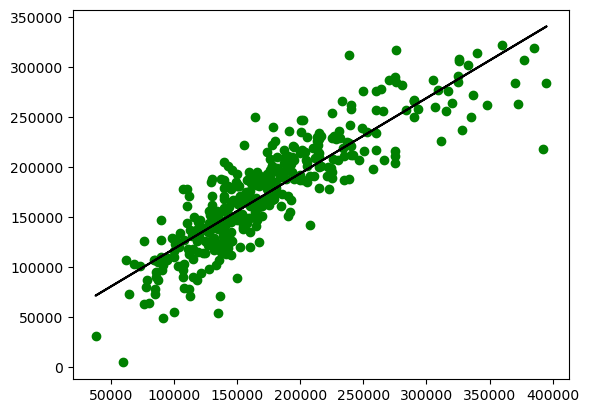

In [33]:
plt.scatter(y_test, predictions,color='g') 
plt.plot(y_test_array, y_regressor,color='black') 

## Change the train and test split proportion

In [34]:
y = dfCleaned.SalePrice
col = dfCleaned.columns.tolist()
col.remove('SalePrice')
x = dfCleaned[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.14, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 15871.71051900959
Mean Squared Error: 493841137.4366765
Mean Absolute Percentage Error: 0.10112593066571478


In [35]:
model.score(x_train, y_train)

0.9040907227158079

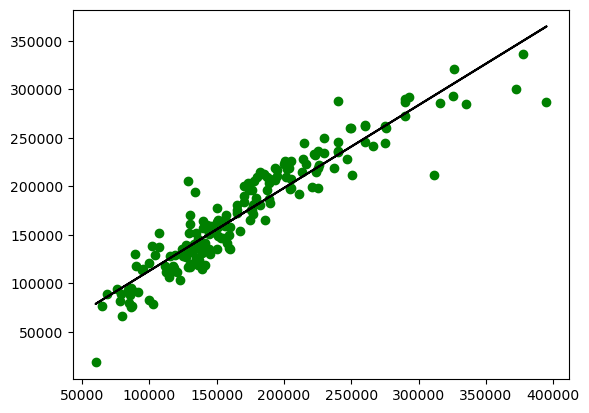

In [36]:
y_test_array = y_test.array.reshape(-1, 1)
regressor = LinearRegression() 
regressor.fit(y_test_array, predictions)
y_regressor = regressor.predict(y_test_array)
plt.scatter(y_test, predictions,color='g') 
plt.plot(y_test_array, y_regressor,color='k') 

## Remove  the outliers

In [37]:
dfCleanedTest = dfCleaned
dfCleanedTest = remove_outliers(dfCleanedTest, ["YearBuilt"])
dfCleanedTest = remove_outliers(dfCleanedTest, ["YearRemodAdd"])
dfCleanedTest = remove_outliers(dfCleanedTest, ["MasVnrArea"])
dfCleanedTest = remove_outliers(dfCleanedTest, ["TotRmsAbvGrd"])
dfCleanedTest = remove_outliers(dfCleanedTest, ["Fireplaces"])
y = dfCleanedTest.SalePrice
col = dfCleanedTest.columns.tolist()
col.remove('SalePrice')
x = dfCleanedTest[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 15214.753573758997
Mean Squared Error: 477241810.61568594
Mean Absolute Percentage Error: 0.08607943868711154


In [38]:
model.score(x_train, y_train)

0.8976257610078535

## Creation of the new predictions

In [39]:
y = dfBasicCleaning.SalePrice
col = dfBasicCleaning.columns.tolist()
col.remove('SalePrice')
x = dfBasicCleaning[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.12, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 18784.509970428775
Mean Squared Error: 789055778.6101525
Mean Absolute Percentage Error: 0.12399825229909639


In [40]:
model.score(x_train, y_train)

0.8466303386232199

## Remove the outliers 

In [41]:
dfBasicCleaningTest = dfBasicCleaning
dfBasicCleaningTest = remove_outliers(dfBasicCleaningTest, dfBasicCleaningTest.columns.tolist())
y = dfBasicCleaningTest.SalePrice
col = dfBasicCleaningTest.columns.tolist()
col.remove('SalePrice')
x = dfBasicCleaningTest[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.18, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 15279.783755898055
Mean Squared Error: 434430229.52999634
Mean Absolute Percentage Error: 0.09814184433759875


In [42]:
model.score(x_train, y_train)

0.9168638472355701

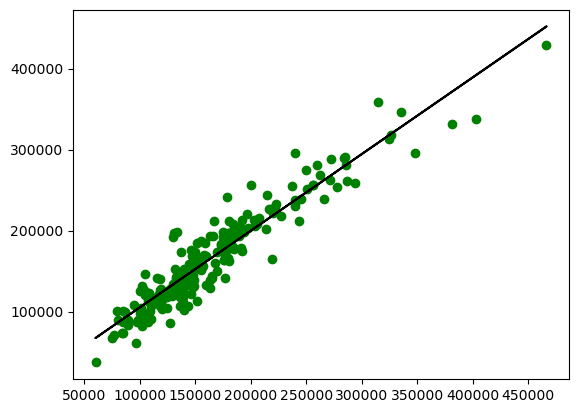

In [43]:
y_test_array = y_test.array.reshape(-1, 1)
regressor = LinearRegression() 
regressor.fit(y_test_array, predictions)
y_regressor = regressor.predict(y_test_array)
plt.scatter(y_test, predictions,color='g') 
plt.plot(y_test_array, y_regressor,color='k')

## Remove the items with the least correlation

In [44]:
dfCleanedTest2 = dfCleaned
dfCleanedTest2 = dfCleanedTest2.drop(['GarageFinish', 'GarageType', 'KitchenQual', 'HeatingQC', 'BsmtQual', 'ExterQual'], axis=1)
y = dfCleanedTest2.SalePrice
col = dfCleanedTest2.columns.tolist()
col.remove('SalePrice')
x = dfCleanedTest2[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.14, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 16448.10551184121
Mean Squared Error: 534058334.6172504
Mean Absolute Percentage Error: 0.1069553656213052


In [45]:
model.score(x_train, y_train)

0.8923997783768125

## Remove of the significant outliers

In [46]:
dfCleanedTest2x = dfCleanedTest2
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["OverallQual"])
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["TotalBsmtSF"])
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["1stFlrSF"])
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["GrLivArea"])
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["FullBath"])
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["GarageCars"])
dfCleanedTest2x = remove_outliers(dfCleanedTest2x, ["GarageArea"])
y = dfCleanedTest2x.SalePrice
col = dfCleanedTest2x.columns.tolist()
col.remove('SalePrice')
x = dfCleanedTest2x[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.29, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 15514.336650751582
Mean Squared Error: 457665807.73187697
Mean Absolute Percentage Error: 0.0953459725749121


In [47]:
model.score(x_train, y_train)

0.8868769147830508

## Remove of the items  with the least correlation

In [48]:
dfCleanedTest3 = dfCleaned
dfCleanedTest3 = dfCleanedTest3.drop(['SaleType', 'MiscFeature', 'PoolQC', 'GarageFinish', 'GarageType', 'FireplaceQu', 'KitchenQual', 'HeatingQC', 'Heating', 'BsmtFinType1', 'BsmtExposure', 'BsmtQual', 'ExterQual', 'BldgType', 'LotConfig', 'LotShape', 'MSZoning', 'EnclosedPorch', 'KitchenAbvGr', 'OverallCond', 'MSSubClass'], axis=1)
y = dfCleanedTest3.SalePrice
col = dfCleanedTest3.columns.tolist()
col.remove('SalePrice')
x = dfCleanedTest3[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.11, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 17518.59919272581
Mean Squared Error: 629921916.7209448
Mean Absolute Percentage Error: 0.10495365867336334


In [49]:
model.score(x_train, y_train)

0.8769459630903153

## Remove significant outliers

In [50]:
dfCleanedTest3x = dfCleanedTest3
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["OverallQual"])
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["TotalBsmtSF"])
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["1stFlrSF"])
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["GrLivArea"])
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["FullBath"])
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["GarageCars"])
dfCleanedTest3x = remove_outliers(dfCleanedTest3x, ["GarageArea"])
y = dfCleanedTest3x.SalePrice
col = dfCleanedTest3x.columns.tolist()
col.remove('SalePrice')
x = dfCleanedTest3x[col]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.16, random_state=1)
model = LinearRegression()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))
print('Mean Absolute Percentage Error:', metrics.mean_absolute_percentage_error(y_test, predictions))

Mean Absolute Error: 16730.557442405807
Mean Squared Error: 507268706.67444634
Mean Absolute Percentage Error: 0.10590000730102936


In [51]:
model.score(x_train, y_train)

0.8717308134717582

## Load the CSV file

In [52]:
dfToPredict = pd.read_csv("HousePrices-FreshDataToPredict.csv")
dfToPredict.shape

(100, 80)

## Display the null values

In [53]:
dfToPredict.columns[dfToPredict.isnull().any()]

Index(['LotFrontage', 'Alley', 'BsmtExposure', 'KitchenQual', 'FireplaceQu',
       'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PoolQC', 'Fence', 'MiscFeature'],
      dtype='object')

## Fill the data

In [54]:
dfToPredict["LotFrontage"].fillna(dfToPredict['LotFrontage'].mean(), inplace = True)
dfToPredict["Alley"].fillna("NA", inplace = True)
dfToPredict["BsmtExposure"].fillna("NA", inplace = True)
dfToPredict["KitchenQual"].fillna("TA", inplace = True)
dfToPredict["FireplaceQu"].fillna("NA", inplace = True)
dfToPredict["GarageType"].fillna("NA", inplace = True)
dfToPredict["GarageYrBlt"].fillna("NA", inplace = True)
dfToPredict["GarageFinish"].fillna("NA", inplace = True)
dfToPredict["GarageQual"].fillna("NA", inplace = True)
dfToPredict["GarageCond"].fillna("NA", inplace = True)
dfToPredict["PoolQC"].fillna("NA", inplace = True)
dfToPredict["Fence"].fillna("NA", inplace = True)
dfToPredict["MiscFeature"].fillna("NA", inplace = True)

## Convert objects values in the dataframe into numeric 

In [55]:
objListPred = dfToPredict.select_dtypes(include=np.object).columns.tolist()
dfToCleanNumPred = dfToPredict.drop(objList, axis = 1)
numListPred = dfToPredict.select_dtypes(include=np.number).columns.tolist()
dfToCleanObjPred = dfToPredict.drop(numListPred, axis = 1)
dfToCleanObjPred = dfToCleanObjPred.astype(str)
dfToCleanObjPred = dfToCleanObjPred.apply(LabelEncoder().fit_transform)
dfBasicCleaningPred = pd.concat([dfToCleanNumPred, dfToCleanObjPred], axis=1, join="outer")

## Prediction of the SalePrice

In [56]:
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Id'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['LotShape'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['LandContour'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['LotConfig'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['LandSlope'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Neighborhood'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Condition1'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Condition2'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['HouseStyle'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['RoofStyle'], axis=1)      
dfBasicCleaningPred=dfBasicCleaningPred.drop(['RoofMatl'], axis=1)       
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Exterior1st'], axis=1)  
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Exterior2nd'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['MasVnrType'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['MasVnrArea'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['ExterQual'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtCond'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtExposure'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['TotalBsmtSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtFinSF1'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtFinType2'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtFinSF2'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtUnfSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['LowQualFinSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GrLivArea'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtFullBath'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['BsmtHalfBath'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['FullBath'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['HalfBath'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Fireplaces'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['FireplaceQu'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GarageType'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GarageYrBlt'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GarageFinish'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GarageCars'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GarageQual'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['GarageCond'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['PavedDrive'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['WoodDeckSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['EnclosedPorch'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['3SsnPorch'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['ScreenPorch'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['MiscVal'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['MoSold'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['YrSold'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['MSSubClass'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Alley'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['SaleType'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['SaleCondition'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['MiscFeature'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['OpenPorchSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['2ndFlrSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['1stFlrSF'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Fence'], axis=1)
dfBasicCleaningPred=dfBasicCleaningPred.drop(['Street'], axis=1)

In [57]:
predToPredict = finalModel.predict(dfBasicCleaningPred)
predToPredict = pd.concat([dfBasicCleaningPred, pd.DataFrame(predToPredict)], axis=1)
predToPredict.columns = [*predToPredict.columns[:-1], 'Predicted SalePrice']
predToPredict.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageArea,PoolArea,MSZoning,Utilities,BldgType,ExterCond,Foundation,BsmtQual,BsmtFinType1,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,PoolQC,Predicted SalePrice
0,80.0,11622,5,6,1961,1961,2,1,5,730,0,2,0,0,2,1,3,4,0,3,1,2,3,3,0,139994.402249
1,81.0,14267,6,6,1958,1958,3,1,6,312,0,3,0,0,2,1,3,0,0,3,1,2,2,3,0,163159.933944
2,74.0,13830,5,5,1997,1998,3,1,6,482,0,3,0,0,2,2,2,2,0,2,1,2,3,3,0,146568.343607
3,78.0,9978,6,6,1998,1998,3,1,7,470,0,3,0,0,2,2,3,2,0,0,1,2,2,3,0,185081.028773
4,43.0,5005,8,5,1992,1992,2,1,5,506,0,3,0,4,2,2,2,0,0,0,1,2,2,3,0,194736.129427
